In [1]:
# Import necessary libraries
import os
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
from glob import glob

In [2]:
# Load the dataset
file_musik = glob('Dataset_musik/*/*.wav')

In [3]:
# Exploratory Data Analysis (EDA)
genre_count = {}
audio_lengths = []

# Iterate through files and extract genre and audio lengths
for file_path in file_musik:
    genre = os.path.basename(os.path.dirname(file_path))
    if genre not in genre_count:
        genre_count[genre] = 0
    genre_count[genre] += 1
    
    y, sr = librosa.load(file_path)
    audio_lengths.append(len(y) / sr)

# Convert genre count to DataFrame
genre_count_df = pd.DataFrame(list(genre_count.items()), columns=['Genre', 'Count'])

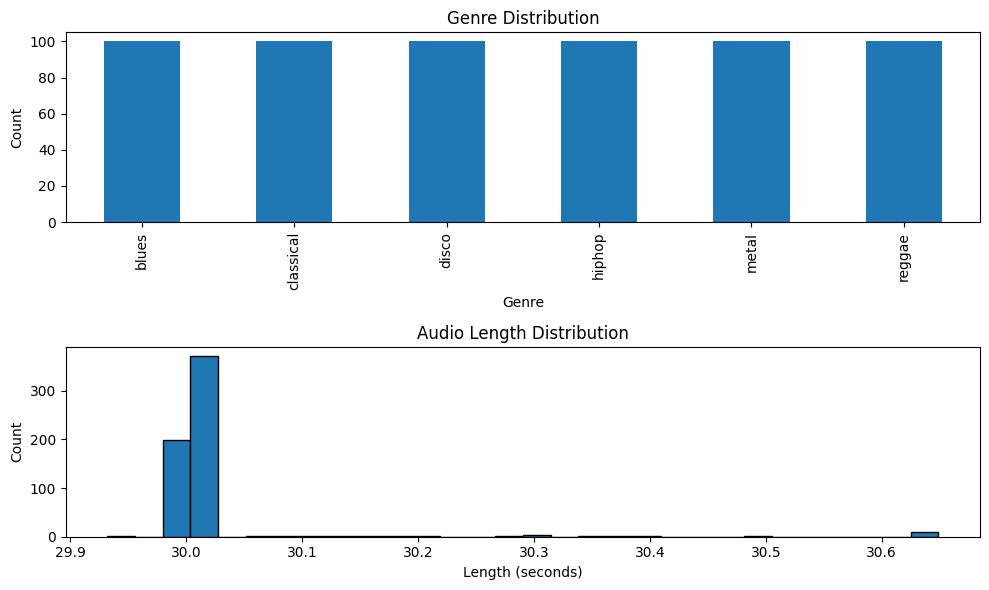

In [4]:
# Visualization
plt.figure(figsize=(10, 6))
# Plot genre distribution
plt.subplot(2, 1, 1)
genre_count_df.set_index('Genre').plot(kind='bar', ax=plt.gca(), legend=None)
plt.title('Genre Distribution')
plt.ylabel('Count')

# Plot audio length distribution
plt.subplot(2, 1, 2)
plt.hist(audio_lengths, bins=30, edgecolor='k')
plt.title('Audio Length Distribution')
plt.xlabel('Length (seconds)')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [5]:
# Define the paths to the specific audio files
specific_files = [
    'Dataset_musik/blues/blues.00077.wav',
    'Dataset_musik/metal/metal.00003.wav'
]

# Define a dictionary to map file paths to their genres
specific_genres = {
    'Dataset_musik/blues/blues.00077.wav': 'blues',
    'Dataset_musik/metal/metal.00003.wav': 'metal'
}

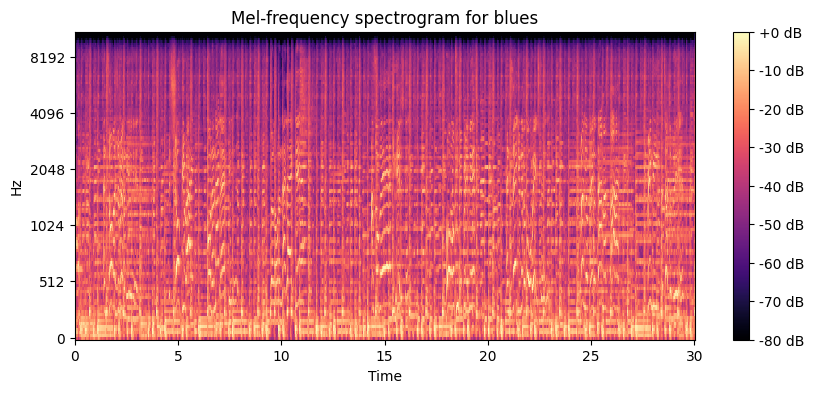

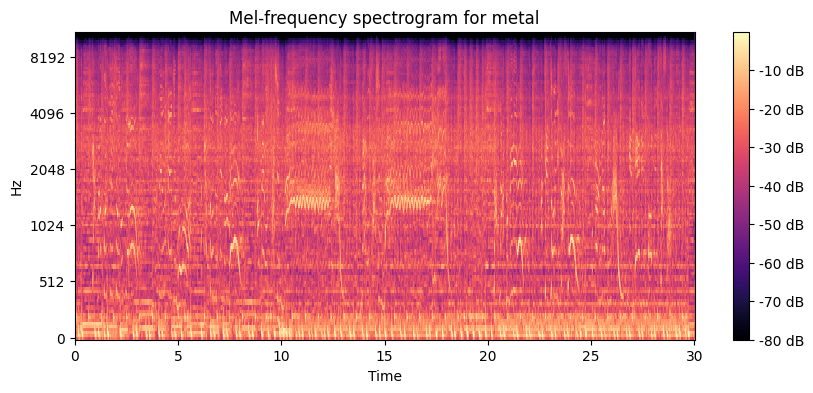

In [6]:
# Function to plot spectrogram
def plot_spectrogram(file_path, genre):
    y, sr = librosa.load(file_path)
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_dB = librosa.power_to_db(S, ref=np.max)
    
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel-frequency spectrogram for {genre}')
    plt.show()

# Plot spectrograms for the specified files
for file_path in specific_files:
    genre = specific_genres[file_path]
    plot_spectrogram(file_path, genre)

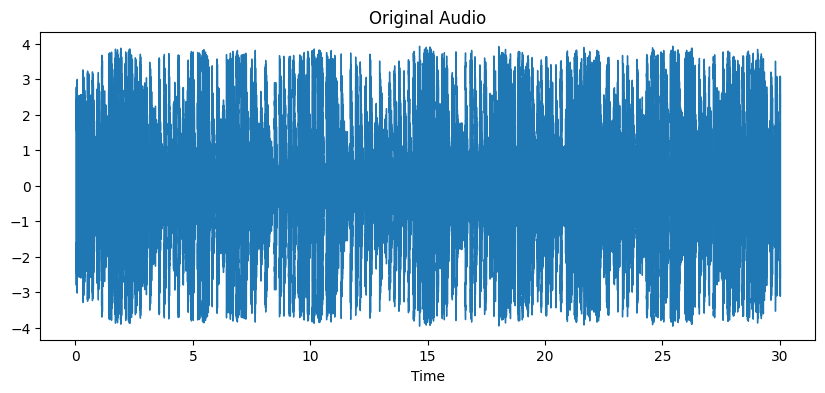

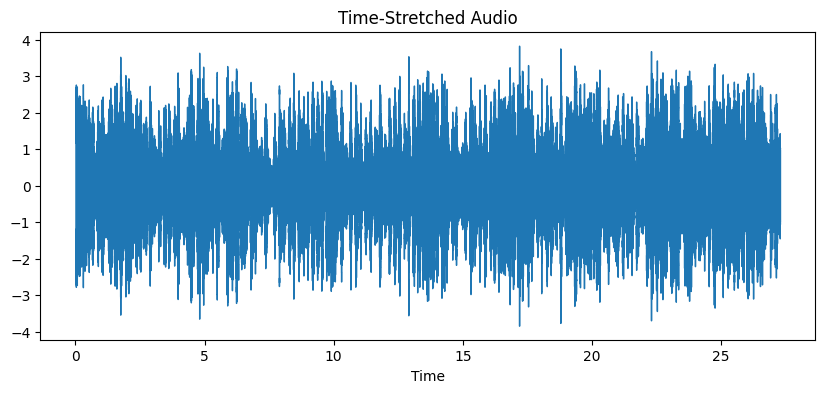

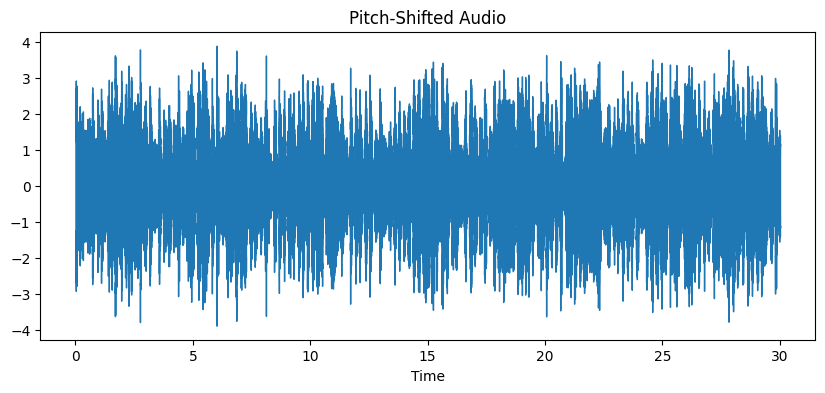

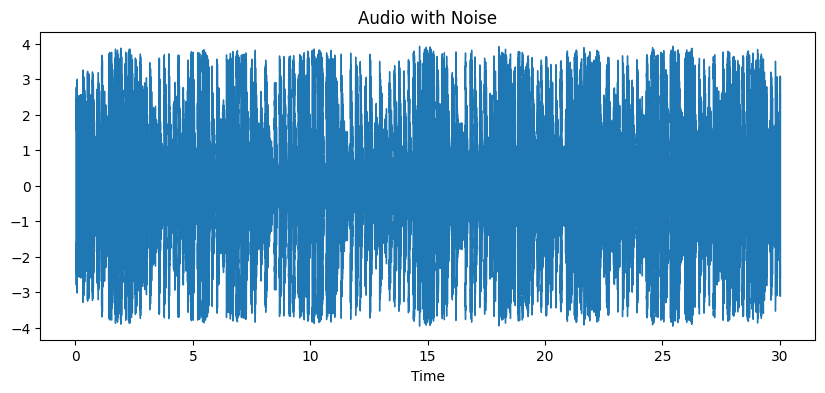

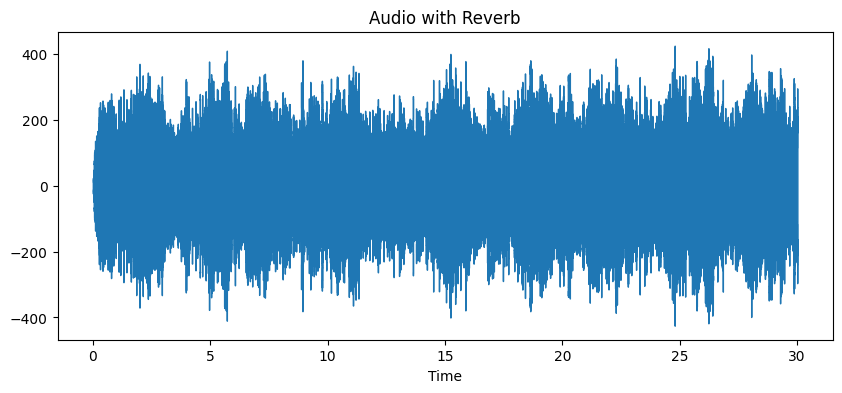

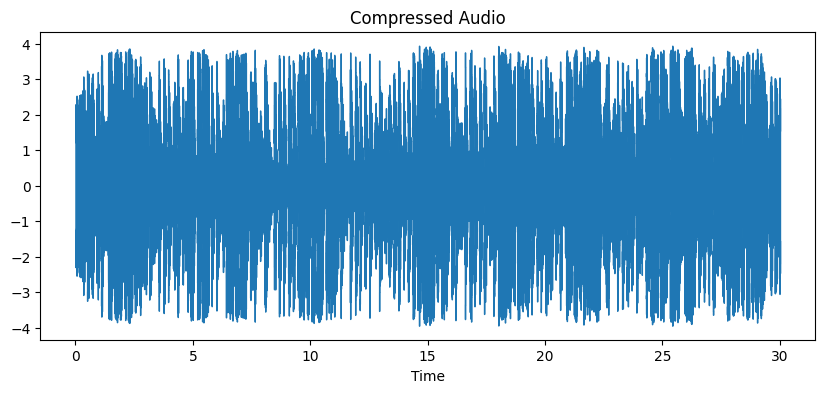

In [7]:
# Import necessary libraries
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd

# Normalization
def normalize_audio(y):
    return (y - np.mean(y)) / np.std(y)

# Silence Removal
def remove_silence(y, sr, top_db=20):
    intervals = librosa.effects.split(y, top_db=top_db)
    non_silent_audio = np.concatenate([y[start:end] for start, end in intervals])
    return non_silent_audio

# Time Stretching
def time_stretch(y, rate=1.1):
    return librosa.effects.time_stretch(y, rate=rate)

# Pitch Shifting
def pitch_shift_audio(y, sr, n_steps=2):
    return librosa.effects.pitch_shift(y=y, sr=sr, n_steps=n_steps)

# Adding Noise
def add_noise(y, noise_factor=0.005):
    noise = np.random.randn(len(y))
    return y + noise_factor * noise

# Reverberation
def add_reverb(y, sr, reverb_factor=0.3):
    reverb = np.convolve(y, np.random.randn(int(sr * reverb_factor)), mode='full')
    return reverb[:len(y)]

# Dynamic Range Compression
def dynamic_range_compression(y, threshold=0.5, ratio=2.0):
    compressed_audio = np.where(y > threshold, y / ratio, y)
    return compressed_audio

# Apply preprocessing and augmentation
def preprocess_and_augment(file_path):
    y, sr = librosa.load(file_path)
    y = normalize_audio(y)
    y = remove_silence(y, sr)
    
    y_stretch = time_stretch(y)
    y_pitch = pitch_shift_audio(y, sr)
    y_noise = add_noise(y)
    y_reverb = add_reverb(y, sr)
    y_compress = dynamic_range_compression(y)
    
    return y, y_stretch, y_pitch, y_noise, y_reverb, y_compress, sr

# Function to plot and play audio
def plot_and_play_audio(y, sr, title):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(y, sr=sr)
    plt.title(title)
    plt.show()
    return ipd.Audio(y, rate=sr)

# Example usage
file_path = 'Dataset_musik/blues/blues.00077.wav'
y, y_stretch, y_pitch, y_noise, y_reverb, y_compress, sr = preprocess_and_augment(file_path)

# Plot and play the original and augmented audios
audio_original = plot_and_play_audio(y, sr, 'Original Audio')
display(audio_original)

audio_stretch = plot_and_play_audio(y_stretch, sr, 'Time-Stretched Audio')
display(audio_stretch)

audio_pitch = plot_and_play_audio(y_pitch, sr, 'Pitch-Shifted Audio')
display(audio_pitch)

audio_noise = plot_and_play_audio(y_noise, sr, 'Audio with Noise')
display(audio_noise)

audio_reverb = plot_and_play_audio(y_reverb, sr, 'Audio with Reverb')
display(audio_reverb)

audio_compress = plot_and_play_audio(y_compress, sr, 'Compressed Audio')
display(audio_compress)

In [8]:
import os
import librosa
import numpy as np
import soundfile as sf

# Function to save audio files
def save_audio(y, sr, save_path):
    sf.write(save_path, y, sr)

# Process all files in the dataset
def process_dataset(dataset_path, output_path):
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.endswith('.wav'):
                file_path = os.path.join(root, file)
                y, y_stretch, y_pitch, y_noise, y_reverb, y_compress, sr = preprocess_and_augment(file_path)
                
                # Save original and augmented files
                category = os.path.basename(root)
                save_dir = os.path.join(output_path, category)
                if not os.path.exists(save_dir):
                    os.makedirs(save_dir)
                
                base_filename = os.path.splitext(file)[0]
                save_audio(y, sr, os.path.join(save_dir, f'{base_filename}_original.wav'))
                save_audio(y_stretch, sr, os.path.join(save_dir, f'{base_filename}_stretch.wav'))
                save_audio(y_pitch, sr, os.path.join(save_dir, f'{base_filename}_pitch.wav'))
                save_audio(y_noise, sr, os.path.join(save_dir, f'{base_filename}_noise.wav'))
                save_audio(y_reverb, sr, os.path.join(save_dir, f'{base_filename}_reverb.wav'))
                save_audio(y_compress, sr, os.path.join(save_dir, f'{base_filename}_compress.wav'))

# Example usage
dataset_path = 'Dataset_musik'
output_path = 'data_augmentation'
process_dataset(dataset_path, output_path)

In [9]:
def count_files_per_classification(dataset_path):
    classification_counts = {}
    
    for root, dirs, files in os.walk(dataset_path):
        for dir in dirs:
            class_path = os.path.join(root, dir)
            if os.path.isdir(class_path):
                classification_counts[dir] = len([file for file in os.listdir(class_path) if file.endswith('.wav')])
    
    return classification_counts

# Count files in the augmented dataset
augmented_dataset_path = 'data_augmentation'
classification_counts = count_files_per_classification(augmented_dataset_path)
classification_counts

{'blues': 600,
 'classical': 600,
 'disco': 600,
 'hiphop': 600,
 'metal': 600,
 'reggae': 600}

In [2]:
import os
import librosa
import numpy as np
import pandas as pd

def extract_mfcc(file_path, n_mfcc=13):
    y, sr = librosa.load(file_path)
    
    # Extract MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
    mfccs_mean = np.mean(mfccs.T, axis=0)
    
    return mfccs_mean

def process_dataset(dataset_path, n_mfcc=13):
    features_list = []
    labels = []
    filenames = []
    
    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.endswith('.wav'):
                file_path = os.path.join(root, file)
                mfccs_mean = extract_mfcc(file_path, n_mfcc=n_mfcc)
                label = os.path.basename(root)
                
                features_list.append(mfccs_mean)
                labels.append(label)
                filenames.append(file)
    
    return np.array(features_list), np.array(labels), np.array(filenames)

# Example usage
dataset_path = 'data_augmentation'
n_mfcc = 13  # Number of MFCCs to extract
features, labels, filenames = process_dataset(dataset_path, n_mfcc=n_mfcc)

# Create a DataFrame for better visualization and handling
features_df = pd.DataFrame(features)
labels_df = pd.DataFrame(labels, columns=['Label'])
filenames_df = pd.DataFrame(filenames, columns=['Filename'])
data_df = pd.concat([features_df, labels_df, filenames_df], axis=1)

# Display the DataFrame
print(data_df.head())  # You can use display(data_df) in Jupyter notebook to visualize the DataFrame

# Save the DataFrame to a CSV file for later use
data_df.to_csv('mfcc_feature_nama.csv', index=False)

            0           1          2          3         4          5  \
0   75.367851   94.663002  -6.047962  23.522724  5.623590   7.062748   
1   79.548317  106.210648 -14.645008  29.993118  0.637655  10.879266   
2   78.795174  107.248825 -15.631576  30.923973 -0.233719  11.697727   
3   57.115437  101.309906  -9.912857  28.526062  0.174984   6.553299   
4  191.837662   61.642399   0.115262  11.327513  4.647036   2.053525   

          6         7         8         9        10        11        12  \
0 -1.858168  3.875179 -2.072541  1.960980 -0.472392  2.816138  1.349091   
1 -5.786230  6.895167 -4.984379  4.464613 -2.621204  4.226893 -0.334580   
2 -6.556943  7.615801 -5.655107  5.089569 -3.199836  4.752909 -0.814779   
3 -5.256702  5.855068 -4.871087  5.365479 -2.807419  5.968037 -3.284598   
4 -0.906726  1.011940 -0.785120 -0.646153 -0.118386  1.604798  0.540065   

   Label                  Filename  
0  blues  blues.00000_compress.wav  
1  blues     blues.00000_noise.wav  
2  bl

In [6]:
data_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,Label,Filename
0,75.367851,94.663002,-6.047962,23.522724,5.623590,7.062748,-1.858168,3.875179,-2.072541,1.960980,-0.472392,2.816138,1.349091,blues,blues.00000_compress.wav
1,79.548317,106.210648,-14.645008,29.993118,0.637655,10.879266,-5.786230,6.895167,-4.984379,4.464613,-2.621204,4.226893,-0.334580,blues,blues.00000_noise.wav
2,78.795174,107.248825,-15.631576,30.923973,-0.233719,11.697727,-6.556943,7.615801,-5.655107,5.089569,-3.199836,4.752909,-0.814779,blues,blues.00000_original.wav
3,57.115437,101.309906,-9.912857,28.526062,0.174984,6.553299,-5.256702,5.855068,-4.871087,5.365479,-2.807419,5.968037,-3.284598,blues,blues.00000_pitch.wav
4,191.837662,61.642399,0.115262,11.327513,4.647036,2.053525,-0.906726,1.011940,-0.785120,-0.646153,-0.118386,1.604798,0.540065,blues,blues.00000_reverb.wav
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3595,100.025719,60.876648,-20.305552,37.775776,2.407781,19.154991,0.613106,4.110295,4.444721,2.177692,2.234499,1.776639,-1.046605,reggae,reggae.00099_noise.wav
3596,99.683693,61.339268,-20.739759,38.187202,2.043277,19.479460,0.327219,4.352973,4.242593,2.343755,2.104820,1.883832,-1.124907,reggae,reggae.00099_original.wav
3597,77.084023,50.034973,-19.138245,41.612835,-0.212621,20.867052,-3.308751,9.554177,1.152207,3.413006,0.186229,-0.205820,-3.217582,reggae,reggae.00099_pitch.wav
3598,191.585999,25.086740,-6.418102,20.962114,9.223938,8.036065,3.811528,3.753670,4.143777,2.930226,2.581218,0.801148,1.126699,reggae,reggae.00099_reverb.wav


In [14]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import torch
from torch.utils.data import DataLoader, TensorDataset

# Load the dataset
file_path = 'mfcc_feature_nama.csv'  # Update this path if necessary
data_df = pd.read_csv(file_path)

# Separate features and labels (excluding the last column which is the song name)
X = data_df.iloc[:, :-2].values  # All columns except the last two (Label and Filename)
y = data_df.iloc[:, -2].values   # The second last column (Label)

# Encode the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

ANN Model - Accuracy: 72.92%


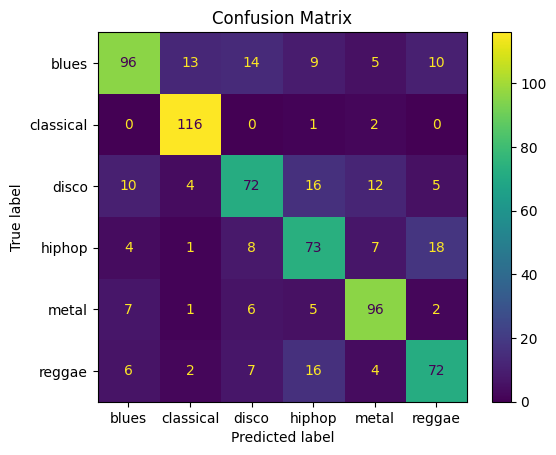

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

class ANNModel(nn.Module):
    def __init__(self, input_size, num_classes):
        super(ANNModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 256)
        self.drop1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, 128)
        self.drop2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(128, 64)
        self.fc4 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.drop1(x)
        x = torch.relu(self.fc2(x))
        x = self.drop2(x)
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        return x

input_size = X_train.shape[1]
num_classes = len(label_encoder.classes_)
ann_model = ANNModel(input_size, num_classes)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(ann_model.parameters(), lr=0.001)

# Training the ANN model
num_epochs = 100
for epoch in range(num_epochs):
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = ann_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

# Evaluate the ANN model
correct = 0
total = 0
all_labels = []
all_predictions = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = ann_model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

ann_accuracy = 100 * correct / total
print(f'ANN Model - Accuracy: {ann_accuracy:.2f}%')

# Generate confusion matrix
conf_matrix = confusion_matrix(all_labels, all_predictions)
ConfusionMatrixDisplay(conf_matrix, display_labels=label_encoder.classes_).plot()
plt.title('Confusion Matrix')
plt.show()


In [20]:
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Subset
from sklearn.model_selection import KFold
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Load the dataset
file_path = 'mfcc_feature_nama.csv'  # Update this path if necessary
data_df = pd.read_csv(file_path)

# Separate features and labels (excluding the last column which is the song name)
X = data_df.iloc[:, :-2].values  # All columns except the last two (Label and Filename)
y = data_df.iloc[:, -2].values   # The second last column (Label)

# Encode the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.long)

# Definisikan model ANN
class ANNModel(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, dropout_rate, num_classes):
        super(ANNModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.drop1 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.drop2 = nn.Dropout(dropout_rate)
        self.fc3 = nn.Linear(hidden_size2, 64)
        self.fc4 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.drop1(x)
        x = torch.relu(self.fc2(x))
        x = self.drop2(x)
        x = torch.relu(self.fc3(x))
        x = self.fc4(x)
        return x

# Definisikan fungsi objective untuk Optuna
def objective(trial):
    # Suggest hyperparameters
    hidden_size1 = trial.suggest_int('hidden_size1', 128, 512)
    hidden_size2 = trial.suggest_int('hidden_size2', 64, 256)
    dropout_rate = trial.suggest_float('dropout_rate', 0.2, 0.5)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    
    # Create the model with suggested hyperparameters
    input_size = X_tensor.shape[1]
    num_classes = len(label_encoder.classes_)
    model = ANNModel(input_size, hidden_size1, hidden_size2, dropout_rate, num_classes)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # K-Fold Cross Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    accuracies = []

    for train_index, val_index in kf.split(X_tensor):
        train_dataset = Subset(TensorDataset(X_tensor, y_tensor), train_index)
        val_dataset = Subset(TensorDataset(X_tensor, y_tensor), val_index)

        train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

        # Training the model
        num_epochs = 50
        for epoch in range(num_epochs):
            model.train()
            for inputs, labels in train_loader:
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

        # Evaluate the model on validation set
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        accuracy = 100 * correct / total
        accuracies.append(accuracy)
    
    # Return the mean accuracy over all folds
    return np.mean(accuracies)

# Run Optuna optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Print the best hyperparameters
print('Best hyperparameters: ', study.best_params)
print('Best accuracy: ', study.best_value)


[I 2024-07-10 17:28:37,171] A new study created in memory with name: no-name-f84386a9-5a54-466d-a0cf-c130fc113aa0
[I 2024-07-10 17:29:55,841] Trial 0 finished with value: 78.02777777777779 and parameters: {'hidden_size1': 248, 'hidden_size2': 155, 'dropout_rate': 0.24131892209508782, 'learning_rate': 0.00011810751316820525}. Best is trial 0 with value: 78.02777777777779.
[I 2024-07-10 17:31:46,266] Trial 1 finished with value: 91.08333333333334 and parameters: {'hidden_size1': 426, 'hidden_size2': 82, 'dropout_rate': 0.24581729073529615, 'learning_rate': 0.0007978389749542512}. Best is trial 1 with value: 91.08333333333334.
[I 2024-07-10 17:33:24,278] Trial 2 finished with value: 87.69444444444444 and parameters: {'hidden_size1': 311, 'hidden_size2': 253, 'dropout_rate': 0.3530194890160377, 'learning_rate': 0.0003170141326966829}. Best is trial 1 with value: 91.08333333333334.
[I 2024-07-10 17:35:16,940] Trial 3 finished with value: 84.36111111111111 and parameters: {'hidden_size1': 46

Best hyperparameters:  {'hidden_size1': 477, 'hidden_size2': 256, 'dropout_rate': 0.2350893128533049, 'learning_rate': 0.0008904989401706559}
Best accuracy:  94.44444444444444


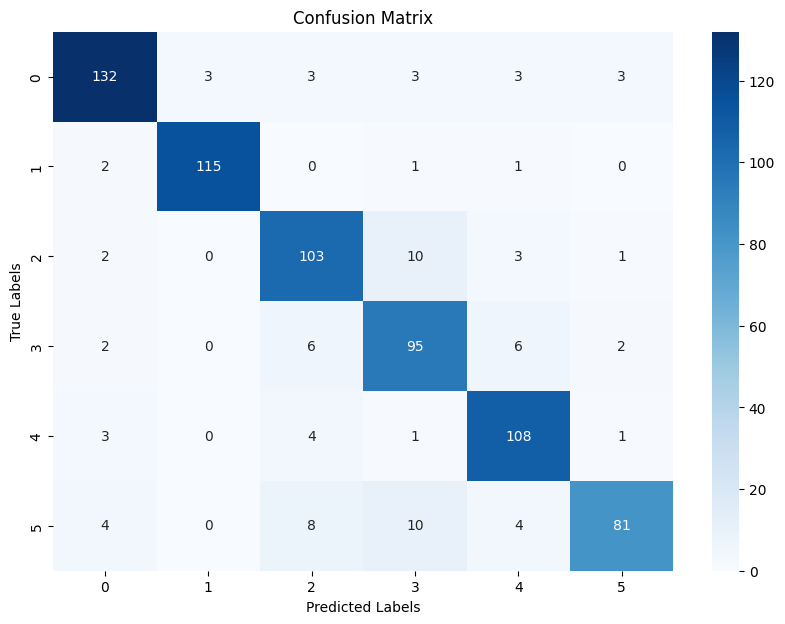

Classification Report:
              precision    recall  f1-score     support
0              0.910345  0.897959  0.904110  147.000000
1              0.974576  0.966387  0.970464  119.000000
2              0.830645  0.865546  0.847737  119.000000
3              0.791667  0.855856  0.822511  111.000000
4              0.864000  0.923077  0.892562  117.000000
5              0.920455  0.757009  0.830769  107.000000
accuracy       0.880556  0.880556  0.880556    0.880556
macro avg      0.881948  0.877639  0.878025  720.000000
weighted avg   0.883463  0.880556  0.880404  720.000000


In [26]:
import pickle
import torch.optim as optim
import torch.nn as nn
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Simpan model terbaik ke dalam file .pkl
best_params = study.best_params

# Definisikan ulang model terbaik menggunakan hyperparameter terbaik
best_model = ANNModel(
    input_size=input_size, 
    hidden_size1=best_params['hidden_size1'], 
    hidden_size2=best_params['hidden_size2'], 
    dropout_rate=best_params['dropout_rate'], 
    num_classes=num_classes
)

# Latih ulang model dengan hyperparameter terbaik
best_model.train()
optimizer = optim.Adam(best_model.parameters(), lr=best_params['learning_rate'])
criterion = nn.CrossEntropyLoss()
num_epochs = 50

for epoch in range(num_epochs):
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = best_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

# Menghitung prediksi pada data uji
best_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = best_model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.numpy())
        all_labels.extend(labels.numpy())

# Menghitung confusion matrix dan classification report
conf_matrix = confusion_matrix(all_labels, all_preds)
class_report = classification_report(all_labels, all_preds, output_dict=True)

# Visualisasi confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Konversi classification report ke DataFrame untuk visualisasi yang lebih baik
class_report_df = pd.DataFrame(class_report).transpose()

# Tampilkan classification report
print("Classification Report:")
print(class_report_df)

In [27]:
# Simpan model ke file .pkl
with open('best_ann_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

# Simpan kelas Label Encoder ke dalam file .npy
np.save('classes.npy', label_encoder.classes_)